#  Project: Generate images using GAN

# Github
https://github.com/mrjaiswa/Monet


What is GAN , how does this work ?

We can create Monets with Generative Adversarial Networks (GAN) in a few different ways. We can generate them from scratch using one GAN, where the GAN basically imagines a Monet from scratch.

GANs or Generative Adversial Networks comprise atleast two neural networks that are trained simultaneously, namely the generator and the discriminator. The generator draws pictures from a noise sample and creates a rendering of the data we are trying to generate. The discriminator randomly gets assigned real and fake data to investigate. The generator learns how to create new images over time that resemble real images and tries to confuse the discriminator whose sole aim is to differentiate between which image is really real and which one is fake/generated.

This will continue to happen till Nash Equilibrium is reached i.e. neither of them are going to learn new tricks.

**What is GAN , how does this work  ?**

We  can create Monets with Generative Adversarial Networks (GAN) in a few different ways. We can generate them from scratch using one GAN, where the GAN basically imagines a Monet from scratch.  

GANs or Generative Adversial Networks comprise atleast two neural networks that are trained simultaneously, namely the generator and the discriminator.
The generator draws pictures from a noise sample and creates a rendering of the data we are trying to generate.
The discriminator randomly gets assigned real and fake data to investigate.
The generator learns how to create new images over time that resemble real images and tries to confuse the discriminator whose sole aim is to differentiate between which image is really real and which one is fake/generated. 

This will continue to happen till Nash Equilibrium is reached i.e. neither of them are going to learn new tricks.


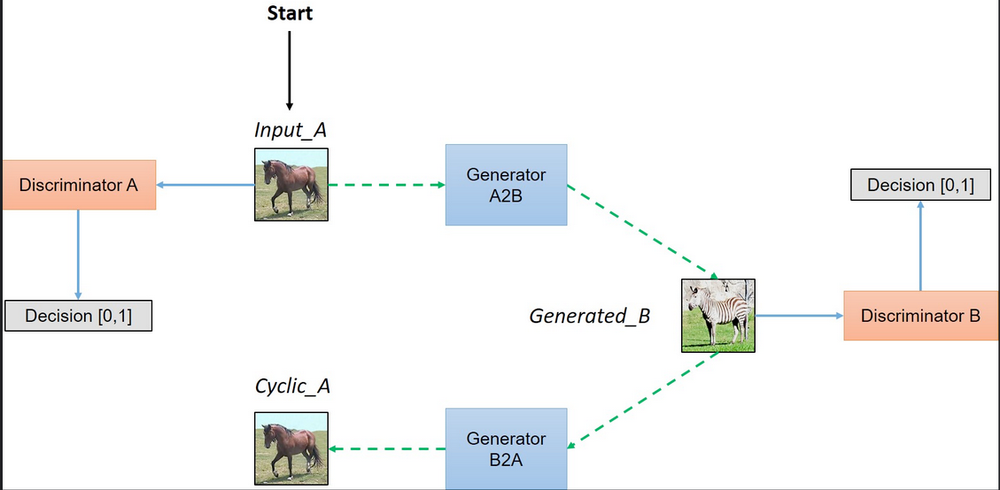


picture and reference --> https://hardikbansal.github.io/CycleGANBlog/

Here what we see is regular generator discriminator thing, where the generator tries to generate images that seem to be drawn to the given domain (in the example will be creating zebra images).
Now it is  possible that the generator generates only the same zebra image or zebra images that do not look like the imputed horse image, this is why the model has a second generator, this second generator uses the first generated image and tries to recreate the original imputed horse image, this way the first generator has to generate zebra images that look like the imputed horse image.
    

In [1]:


!pip3 install imageio
!pip3 install Seaborn
import os, random, json, PIL, shutil, re
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from kaggle_datasets import KaggleDatasets
import tensorflow as tf
import tensorflow.keras.layers as L
import tensorflow_addons as tfa
from tensorflow.keras import Model, losses, optimizers


import glob
import imageio
import matplotlib.pyplot as plt
import os
import PIL
import time

from IPython import display
import cv2
from tensorflow.keras  import layers


import tensorflow as tf
from tensorflow import keras
import re
import math
import warnings
warnings.filterwarnings('ignore')





     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 313.2/313.2 kB 6.4 MB/s eta 0:00:00








[notice] A new release of pip is available: 23.0.1 -> 23.1.2

[notice] To update, run: pip install --upgrade pip



     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 293.3/293.3 kB 5.7 MB/s eta 0:00:00






















[notice] A new release of pip is available: 23.0.1 -> 23.1.2

[notice] To update, run: pip install --upgrade pip


D0621 19:09:07.820913797      13 config.cc:119]                        gRPC EXPERIMENT tcp_frame_size_tuning               OFF (default:OFF)

D0621 19:09:07.820945177      13 config.cc:119]                        gRPC EXPERIMENT tcp_rcv_lowat                       OFF (default:OFF)

D0621 19:09:07.820949319      13 config.cc:119]                        gRPC EXPERIMENT peer_state_based_framing            OFF (default:OFF)

D0621 19:09:07.820952412      13 config.cc:119]                        gRPC EXPERIMENT flow_control_fixes                  ON  (default:ON)

D0621 19:09:07.820955333      13 config.cc:119]                        gRPC EXPERIMENT memory_pressure_controller          OFF (default:OFF)

D0621 19:09:07.820958422      13 config.cc:119]                        gRPC EXPERIMENT unconstrained_max_quota_buffer_size OFF (default:OFF)

D0621 19:09:07.820961519      13 config.cc:119]                        gRPC EXPERIMENT new_hpack_huffman_decoder           ON  (default:ON)

D0621 19

In [2]:
try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    print('Device:', tpu.master())
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)
except:
    strategy = tf.distribute.get_strategy()
print('Number of replicas:', strategy.num_replicas_in_sync)

AUTOTUNE = tf.data.experimental.AUTOTUNE
    
print(tf.__version__)

Device: 

INFO:tensorflow:Deallocate tpu buffers before initializing tpu system.

INFO:tensorflow:Initializing the TPU system: local

INFO:tensorflow:Finished initializing TPU system.


INFO:tensorflow:Found TPU system:


INFO:tensorflow:Found TPU system:


INFO:tensorflow:*** Num TPU Cores: 8


INFO:tensorflow:*** Num TPU Cores: 8


INFO:tensorflow:*** Num TPU Workers: 1


INFO:tensorflow:*** Num TPU Workers: 1


INFO:tensorflow:*** Num TPU Cores Per Worker: 8


INFO:tensorflow:*** Num TPU Cores Per Worker: 8


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:0, CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:0, CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:0, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:0, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:1, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:1, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:2, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:2, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:3, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:3, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:4, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:4, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:5, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:5, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:6, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:6, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:7, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:7, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU_SYSTEM:0, TPU_SYSTEM, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU_SYSTEM:0, TPU_SYSTEM, 0, 0)


Number of replicas: 8

2.12.0


 Difference types of GAN

There are broadly 2 types of GAN:

1. DCGAN 
2. CycleGAN


# DCGAN
DCGAN: 
    DCGAN is primarily focused on generating realistic and high-quality images. It aims to learn the distribution of training images and generate new images that resemble the training data.
    It consists of a generator network and a discriminator network. The generator network generates synthetic images from random noise, while the discriminator network tries to distinguish between real and fake images.
    DCGAN uses the standard GAN loss, which involves minimizing the binary cross-entropy between the discriminator's predictions for real and fake images.
    
    
    


# CycleGAN

CycleGAN is designed for image-to-image translation tasks. It aims to learn mappings between two different domains without the need for paired training data. It can convert images from one domain to another while preserving the semantic content.
It also consists of a generator network and a discriminator network. However, it includes two generator networks and two discriminator networks. One set of generator and discriminator networks is used for translating images from one domain to another, while the other set is used for the reverse translation.introduces additional losses to enforce cycle consistency. It includes adversarial loss, cycle consistency loss, and identity loss. The cycle consistency loss ensures that an image translated from one domain to another and back retains its original content.



Why I chose CycleGAN:
    
    DCGAN is suitable when the goal is to generate realistic and high-quality images. It has been widely used for tasks such as generating images of objects, faces, or scenes.
    CycleGAN is more appropriate when there is a need for image-to-image translation between two different domains. It has been successfully applied to tasks like style transfer, object transfiguration, and image colorization.

The choice between DCGAN and CycleGAN depends on the specific problem you are trying to solve. If your goal is image generation, DCGAN may be more suitable. If you need to translate images between different domains, CycleGAN provides a powerful framework, this is why I chose this.

Up top we have imported the base libraries that will be used in this. After reading the blogs and other resources it was advised that we should use TPU:
https://www.kaggle.com/docs/tpu

In [3]:


GCS_PATH = '/kaggle/input/gan-getting-started/'
MONET_FILE = tf.io.gfile.glob(str(GCS_PATH + '/monet_jpg/*.jpg'))
PHOTO_FILE = tf.io.gfile.glob(str(GCS_PATH + '/photo_jpg/*.jpg'))

MONET_FILE_TFREC = tf.io.gfile.glob(str(GCS_PATH + '/monet_tfrec/*.tfrec'))
PHOTO_FILE_TFREC = tf.io.gfile.glob(str(GCS_PATH + '/photo_tfrec/*.tfrec'))



Here I am setting the directory and few Const that I will use later

In [4]:
BUFFER_SIZE = 1000
BATCH_SIZE =  4
EPOCHS_NUM = 10
IMG_WIDTH = 256
IMG_HEIGHT = 256
OUTPUT_CHANNELS = 3
AUTO = tf.data.experimental.AUTOTUNE
AUTOTUNE = tf.data.experimental.AUTOTUNE  

In [5]:
def count_data_items(filenames):
    n = [int(re.compile(r"-([0-9]*)\.").search(filename).group(1)) for filename in filenames]
    return np.sum(n)

def get_folder_info(path):
    d_image_sizes = {}
    for image_name in os.listdir(path):
        image = cv2.imread(os.path.join(path, image_name))
        d_image_sizes[image.shape] = d_image_sizes.get(image.shape, 0) + 1
        
    for size, count in d_image_sizes.items():
        print(f'shape: {size}\tcount: {count}')

Few Helper Functions that I am using to display Images

In [6]:


def display_image(path, n_images, figsize=(16, 16),channel_vis=False):
    plt.figure(figsize=figsize)
    
    w = int(n_images ** .5)
    h = math.ceil(n_images / w)
    
    all_names = os.listdir(path)
    
    image_names = all_names[:n_images]
    
    image_names = random.sample(all_names, n_images)
    
    

    if channel_vis == 'color':
        plt.figure(figsize=figsize)
        for ind, image_name in enumerate(image_names):
            img = cv2.imread(os.path.join(path, image_name))
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 
            plt.subplot(1, 4, 1)
            plt.imshow(img)
            plt.axis('off')

            for i in range(3):
                plt.subplot(1, 4, i + 2)
                tmp_img = np.full_like(img, 0)
                tmp_img[:, :, i] = img[:, :, i]
                plt.imshow(tmp_img)
                plt.xlim(0, 255)
                plt.xticks([])
                plt.yticks([])
            plt.show()
    elif channel_vis=='gray':
        plt.figure(figsize=figsize)
        for ind, image_name in enumerate(image_names):
            img = cv2.imread(os.path.join(path, image_name))
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 
            plt.subplot(1, 2, 1)
            plt.imshow(img)
            plt.axis('off')

            plt.subplot(1, 2, 2)
            tmp_img = np.full_like(img, 0)
            for i in range(3):
                tmp_img[:, :, i] = img.mean(axis=-1)
            plt.imshow(tmp_img)
            plt.axis('off')
            plt.show()
        
    else:
        for ind, image_name in enumerate(image_names):
            img = cv2.imread(os.path.join(path, image_name))
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 
            plt.subplot(h, w, ind + 1)
            plt.imshow(img)
            plt.axis('off')
    plt.show()



In [7]:


number_monet_samples = count_data_items(MONET_FILE_TFREC)
number_photo_samples = count_data_items(PHOTO_FILE_TFREC)
BASE_PATH = '../input/gan-getting-started/'
MONET_PATH = os.path.join(BASE_PATH, 'monet_jpg')
PHOTO_PATH = os.path.join(BASE_PATH, 'photo_jpg')



In [8]:
print(f"Number of Monet images: {len(MONET_FILE)}\n")
print(f"Number of Photo images: {len(PHOTO_FILE)}\n")
print('Monet TFRecord Files:', len(MONET_FILE_TFREC))
print('Photo TFRecord Files:', len(PHOTO_FILE_TFREC))
print('Number of Monet TFRecord Files:', len(MONET_FILE_TFREC))
print('Number of Photo TFRecord Files:', len(PHOTO_FILE_TFREC))

Number of Monet images: 300



Number of Photo images: 7038



Monet TFRecord Files: 5

Photo TFRecord Files: 20

Number of Monet TFRecord Files: 5

Number of Photo TFRecord Files: 20


In [9]:


get_folder_info(MONET_PATH)



shape: (256, 256, 3)	count: 300


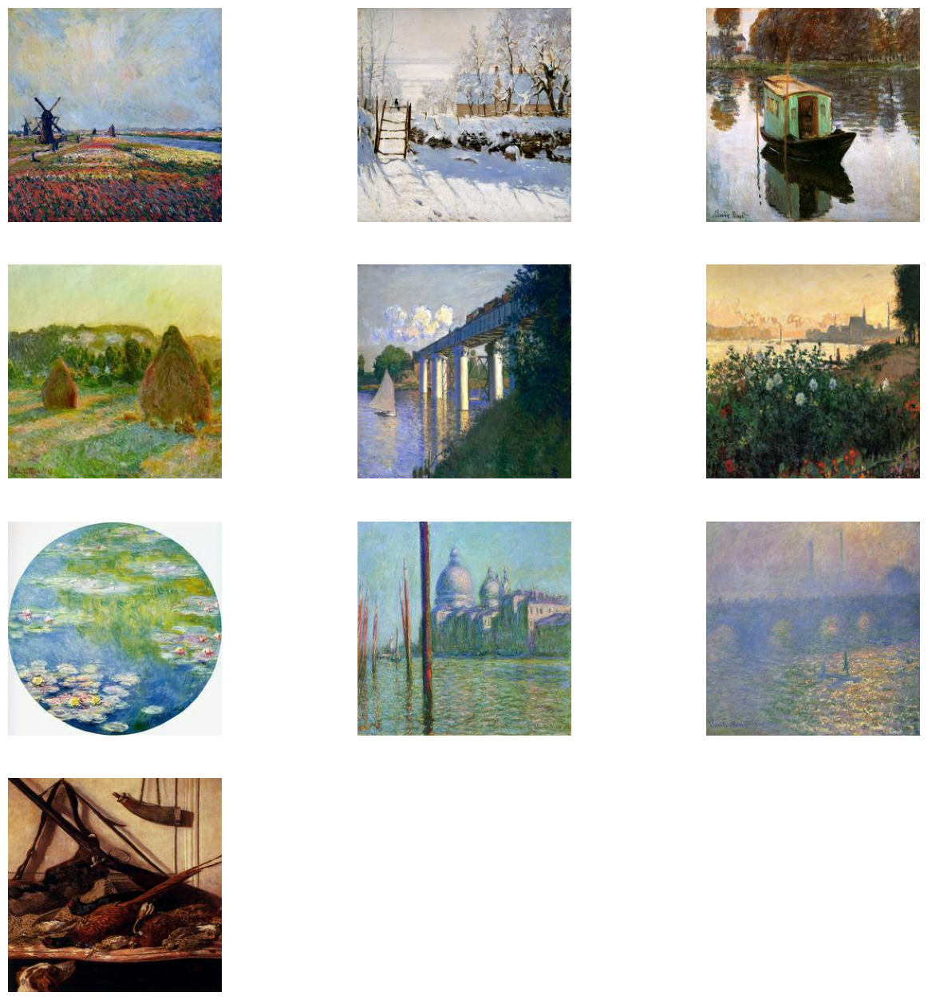

<Figure size 1600x1600 with 0 Axes>

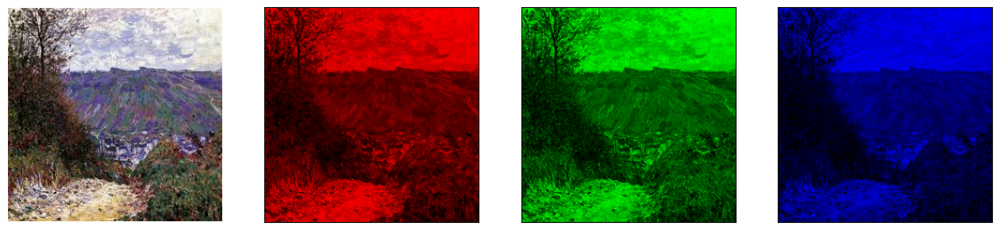

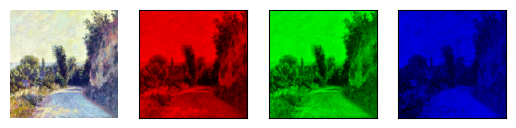

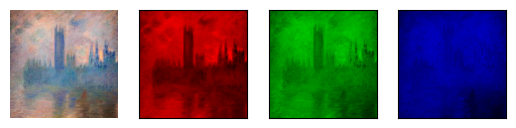

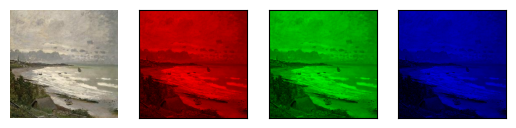

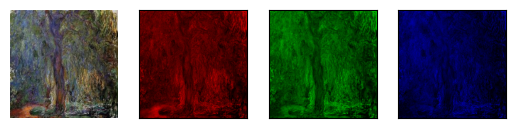

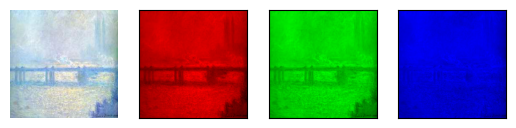

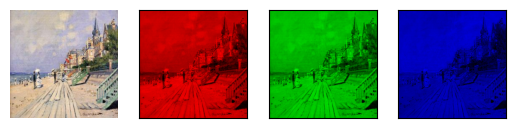

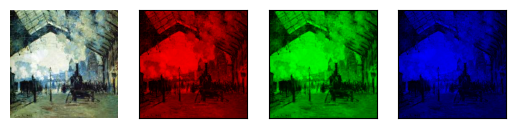

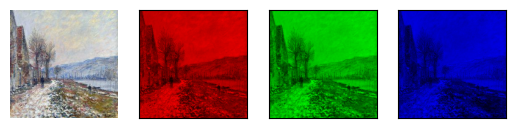

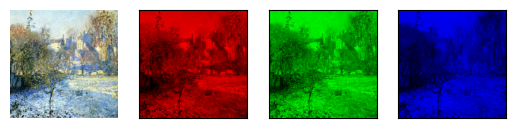

<Figure size 1600x1600 with 0 Axes>

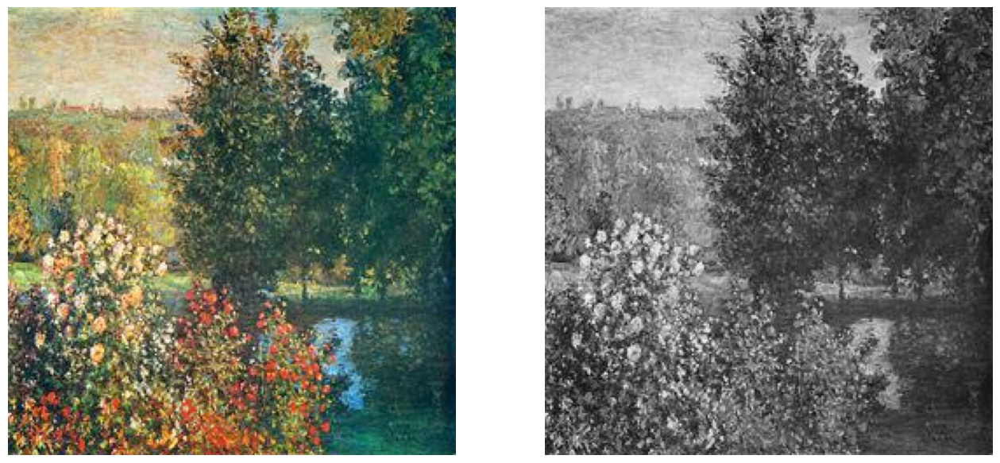

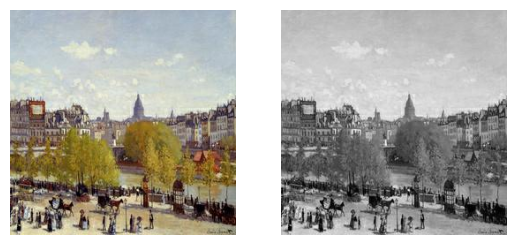

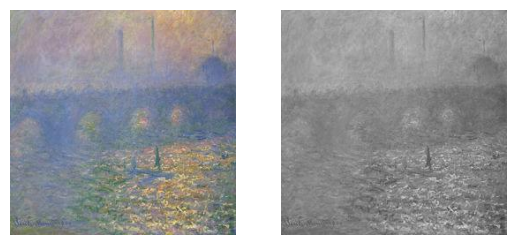

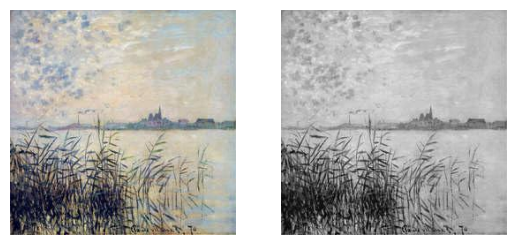

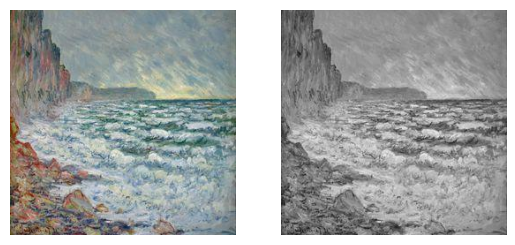

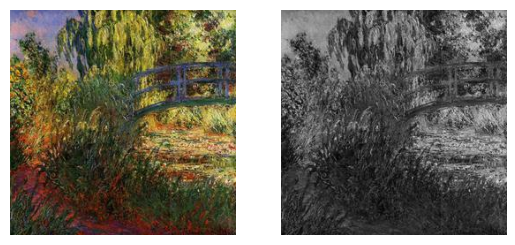

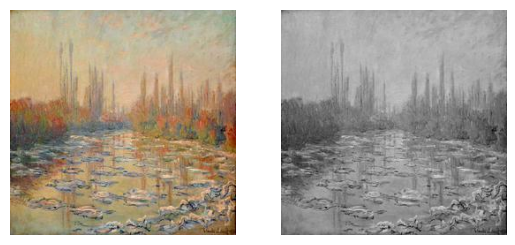

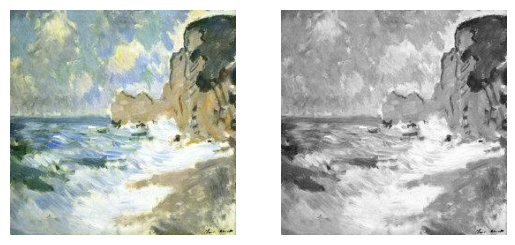

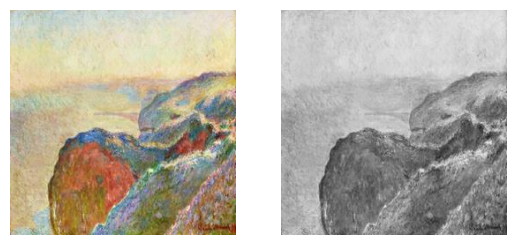

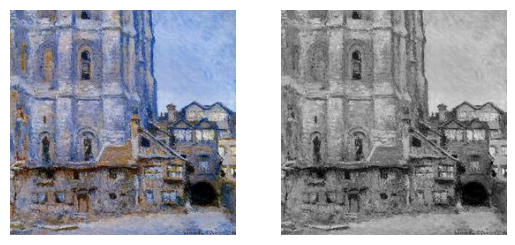

In [10]:
display_image(MONET_PATH, 10)
display_image(MONET_PATH, 10,channel_vis='color')
display_image(MONET_PATH, 10,channel_vis='gray')

#   Here I am using MNIST datset just to show how generator and discriminator works

  This is DCGAN approach of doing this.

Generator:
     A generator refers to a component or network that takes random noise or input and generates new samples that resemble the training data. It is an essential part of generative models such as Generative Adversarial Networks (GANs) and Variational Autoencoders (VAEs).

In the case of GANs, the generator network takes random noise as input and transforms it into synthetic samples. The objective of the generator is to generate samples that are similar to the real data samples from the training set. The generator typically consists of several layers, such as fully connected layers or convolutional layers, and uses activation functions to transform the input noise into a meaningful representation that resembles the training data distribution.
In both GANs and VAEs, the generator plays a crucial role in generating new samples that capture the characteristics and patterns of the training data. Its objective is to learn the underlying data distribution and produce samples that are indistinguishable from real data, allowing the generative model to generate new, realistic samples that exhibit similar properties to the training data.

    

Discriminator:
    A discriminator refers to a component or network that learns to distinguish between real data samples and generated (fake) samples. It is an integral part of Generative Adversarial Networks (GANs) and plays a critical role in the training process.

The discriminator network is trained to classify input samples as either real or fake. In the case of GANs, the input samples can be both real data samples from the training set and generated samples produced by the generator network. The objective of the discriminator is to accurately classify real samples as real (label 1) and generated samples as fake (label 0). It aims to learn to differentiate between the two types of samples based on their features and patterns.

The discriminator network typically consists of several layers, such as fully connected layers or convolutional layers, followed by activation functions. It takes an input sample and produces a single output value, which represents the probability or confidence score that the input sample is real. During the training process, the discriminator is updated to improve its ability to correctly classify real and fake samples.


11490434/11490434 [==============================] - 0s 0us/step


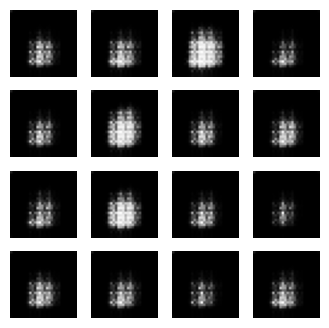

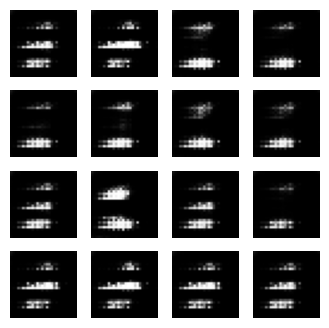

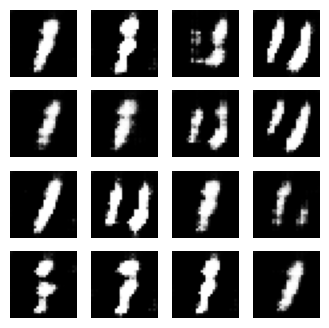

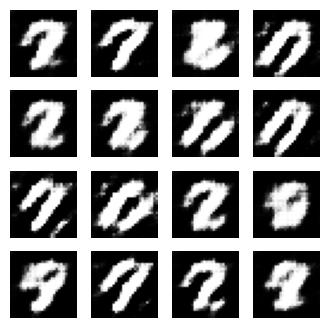

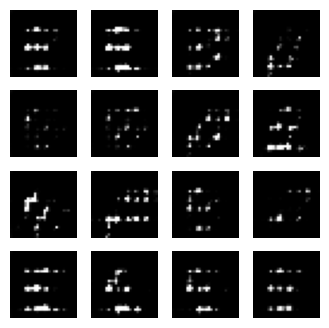

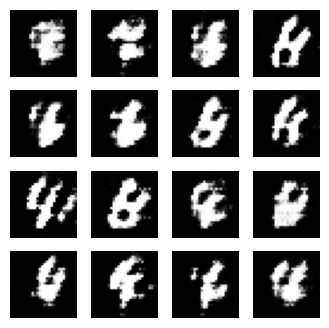

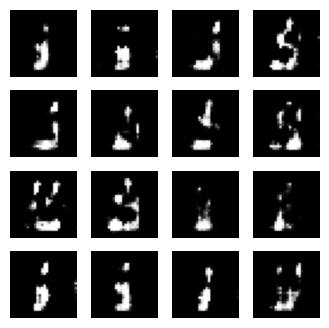

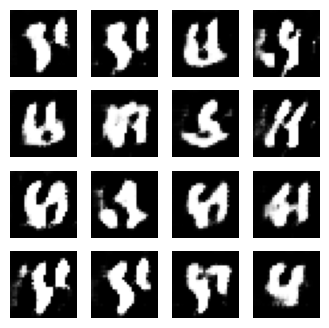

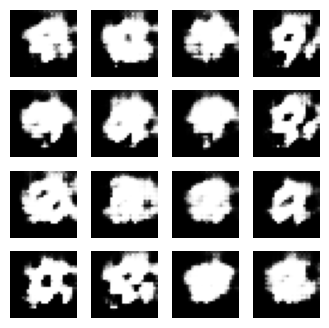

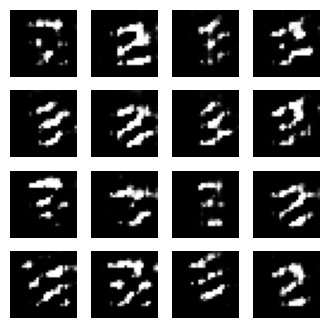

In [22]:
def build_generator(latent_dim):
    model = keras.Sequential()

    # First: Dense layer with input_dim=latent_dim
    model.add(layers.Dense(7*7*256, use_bias=False, input_shape=(latent_dim,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Reshape((7, 7, 256)))

    # Second: Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(1, 1), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Third: Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Fourth: Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(1, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))

    return model

# Discriminator
def build_discriminator():
    model = keras.Sequential()

    # First: Conv2D layer
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[28, 28, 1]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    # Second: Conv2D layer
    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Flatten())
    model.add(layers.Dense(1))

    return model

# Generator loss
def generator_loss(fake_output):
    return tf.reduce_mean(fake_output)

# Discriminator loss
def discriminator_loss(real_output, fake_output):
    real_loss = tf.reduce_mean(real_output)
    fake_loss = tf.reduce_mean(fake_output)
    total_loss = real_loss - fake_loss
    return total_loss

# Optimizers
generator_optimizer = keras.optimizers.Adam(1e-4)
discriminator_optimizer = keras.optimizers.Adam(1e-4)

# Training loop
@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, latent_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

# Generate and save images
def generate_and_save_images(model, epoch, test_input):
    predictions = model(test_input, training=False)

    fig = plt.figure(figsize=(4, 4))

    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i+1)
        plt.imshow(predictions[i, :, :, 0] * 0.5 + 0.5, cmap='gray')
        plt.axis('off')

    plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()

# Training
def train(dataset, epochs):
    for epoch in range(epochs):
        for image_batch in dataset:
            train_step(image_batch)

        generate_and_save_images(generator, epoch+1, seed)

# Hyperparameters
latent_dim = 100
epochs = 10
num_examples_to_generate = 16
BATCH_SIZE = 256

# Load and preprocess the dataset
(train_images, train_labels), (_, _) = keras.datasets.mnist.load_data()
train_images = train_images.reshape(train_images.shape[0], 28, 28, 1).astype('float32')
train_images = (train_images - 127.5) / 127.5
train_dataset = tf.data.Dataset.from_tensor_slices(train_images).shuffle(60000).batch(BATCH_SIZE)

# Build the generator and discriminator
generator = build_generator(latent_dim)
discriminator = build_discriminator()

# Generate a random noise for testing
seed = tf.random.normal([num_examples_to_generate, latent_dim])

# Train the model
train(train_dataset, epochs)



# Image Augmentation

Here I am doing some Image augmentation

In [11]:
def decode_image(image):
    # Decode a JPEG-encoded image to a uint8 tensor.
    image = tf.image.decode_jpeg(image, channels=3)

    image = (tf.cast(image, tf.float32) / 127.5) - 1        
    
    # Reshape the tensor using (256, 256, 3) where 3 is number of channels: Red, Green, and Blue 
    image = tf.reshape(image, [IMG_HEIGHT, IMG_WIDTH, 3])             
    return image

def read_tfrecord(example):
    # Define TFRecord format 
    tfrecord_format = {
        "image_name": tf.io.FixedLenFeature([], tf.string),
        "image":      tf.io.FixedLenFeature([], tf.string),
        "target":     tf.io.FixedLenFeature([], tf.string)
    }
    # Parse a single example
    example = tf.io.parse_single_example(example, tfrecord_format)  
    # Decode a JPEG image to a uint8 tensor by calling decode_image()
    image = decode_image(example['image'])    
    
    return image # Return an image tensor

def data_augment(image):
    p_rotate = tf.random.uniform([], 0, 1.0, dtype=tf.float32)
    p_spatial = tf.random.uniform([], 0, 1.0, dtype=tf.float32)
    p_crop = tf.random.uniform([], 0, 1.0, dtype=tf.float32)
    
    # Apply jitter
    if p_crop > .5:
        image = tf.image.resize(image, [286, 286])
        image = tf.image.random_crop(image, size=[256, 256, 3])
        if p_crop > .9:
            image = tf.image.resize(image, [300, 300])
            image = tf.image.random_crop(image, size=[256, 256, 3])
    
    # Random rotation
    if p_rotate > .9:
        image = tf.image.rot90(image, k=3) # rotate 270º
    elif p_rotate > .7:
        image = tf.image.rot90(image, k=2) # rotate 180º
    elif p_rotate > .5:
        image = tf.image.rot90(image, k=1) # rotate 90º
    
    # Random mirroring
    if p_spatial > .6:
        image = tf.image.random_flip_left_right(image)
        image = tf.image.random_flip_up_down(image)
        if p_spatial > .9:
            image = tf.image.transpose(image)
    
    return image



def load_dataset(filenames, labeled=True, ordered=False):
    dataset = tf.data.TFRecordDataset(filenames)
    # map a dataset with a mapping function read_tfrecord and 
    # Number of parallel calls is set to AUTOTUNE constant previously defined
    dataset = dataset.map(read_tfrecord, num_parallel_calls=AUTOTUNE)
    return dataset

def get_gan_dataset(monet_files, photo_files, augment=None, repeat=True, shuffle=True, batch_size=1):

    monet_ds = load_dataset(monet_files)
    photo_ds = load_dataset(photo_files)
    
    if augment:
        monet_ds = monet_ds.map(augment, num_parallel_calls=AUTO)
        photo_ds = photo_ds.map(augment, num_parallel_calls=AUTO)

    if repeat:
        monet_ds = monet_ds.repeat()
        photo_ds = photo_ds.repeat()
        
    if shuffle:
        monet_ds = monet_ds.shuffle(2048)
        photo_ds = photo_ds.shuffle(2048)
        
    monet_ds = monet_ds.batch(batch_size, drop_remainder=True)
    photo_ds = photo_ds.batch(batch_size, drop_remainder=True)
    monet_ds = monet_ds.cache()
    photo_ds = photo_ds.cache()
    monet_ds = monet_ds.prefetch(AUTO)
    photo_ds = photo_ds.prefetch(AUTO)
    
    gan_ds = tf.data.Dataset.zip((monet_ds, photo_ds))
    
    return gan_ds

In [12]:
BATCHSIZE = 1
monet_ds = load_dataset(MONET_FILE_TFREC, labeled=True).batch(BATCHSIZE, drop_remainder=True)
photo_ds = load_dataset(PHOTO_FILE_TFREC, labeled=True).batch(BATCHSIZE, drop_remainder=True)


In [ ]:
Loaded the Fulldataset

In [13]:
full_dataset = get_gan_dataset(MONET_FILE_TFREC, PHOTO_FILE_TFREC, augment=data_augment, repeat=True, shuffle=True, batch_size=BATCH_SIZE)

example_monet , example_photo = next(iter(full_dataset))   



    Downsampling (also known as subsampling or decimation): It involves reducing the resolution or size of an image by removing pixels or decreasing the density of information. Downsampling is typically done to reduce the computational requirements or storage space of an image while sacrificing some level of detail. The process involves discarding or averaging neighboring pixels to obtain a lower-resolution representation of the original image. The result is a smaller image with fewer pixels.

    Upsampling (also known as interpolation or expansion): It involves increasing the resolution or size of an image by adding pixels or increasing the density of information. Upsampling is used to enlarge an image or restore lost details during downsampling. The process involves inserting new pixels between existing pixels based on interpolation techniques to generate a higher-resolution version of the original image. The result is a larger image with more pixels.

In [14]:
def downsample(filters, size, apply_instancenorm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    result = keras.Sequential()
    result.add(layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

    if apply_instancenorm:
        result.add(tfa.layers.InstanceNormalization(gamma_initializer=gamma_init))

    result.add(layers.LeakyReLU())

    return result

def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    result = keras.Sequential()
    result.add(layers.Conv2DTranspose(filters, size, strides=2,
                                      padding='same',
                                      kernel_initializer=initializer,
                                      use_bias=False))

    result.add(tfa.layers.InstanceNormalization(gamma_initializer=gamma_init))

    if apply_dropout:
        result.add(layers.Dropout(0.5))

    result.add(layers.ReLU())

    return result


def Generator():
    inputs = layers.Input(shape=[256,256,3])

    # bs = batch size
    down_stack = [
        downsample(64, 4, apply_instancenorm=False), 
        downsample(128, 4), 
        downsample(256, 4), 
        downsample(512, 4), 
        downsample(512, 4), 
        downsample(512, 4), 
        downsample(512, 4), 
        downsample(512, 4), 
    ]

    up_stack = [
        upsample(512, 4, apply_dropout=True), 
        upsample(512, 4, apply_dropout=True), 
        upsample(512, 4, apply_dropout=True), 
        upsample(512, 4), 
        upsample(256, 4), 
        upsample(128, 4), 
        upsample(64, 4), 
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                  strides=2,
                                  padding='same',
                                  kernel_initializer=initializer,
                                  activation='tanh') # (bs, 256, 256, 3)

    x = inputs

    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = layers.Concatenate()([x, skip])

    x = last(x)

    return keras.Model(inputs=inputs, outputs=x)

def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    inp = layers.Input(shape=[256, 256, 3], name='input_image')

    x = inp

    down1 = downsample(64, 4, False)(x) # (bs, 128, 128, 64)
    down2 = downsample(128, 4)(down1) # (bs, 64, 64, 128)
    down3 = downsample(256, 4)(down2) # (bs, 32, 32, 256)

    zero_pad1 = layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
    conv = layers.Conv2D(512, 4, strides=1,
                         kernel_initializer=initializer,
                         use_bias=False)(zero_pad1) # (bs, 31, 31, 512)

    norm1 = tfa.layers.InstanceNormalization(gamma_initializer=gamma_init)(conv)

    leaky_relu = layers.LeakyReLU()(norm1)

    zero_pad2 = layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)

    last = layers.Conv2D(1, 4, strides=1,
                         kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)

    return tf.keras.Model(inputs=inp, outputs=last)

In [15]:


with strategy.scope():
    monet_generator = Generator() # transforms photos to Monet-esque paintings
    photo_generator = Generator() # transforms Monet paintings to be more like photos

    monet_discriminator = Discriminator() # differentiates real Monet paintings and generated Monet paintings
    photo_discriminator = Discriminator() #



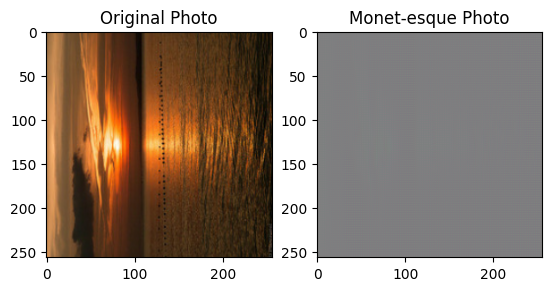

In [16]:
to_monet = monet_generator(example_photo)

plt.subplot(1, 2, 1)
plt.title("Original Photo")
plt.imshow(example_photo[0] * 0.5 + 0.5)

plt.subplot(1, 2, 2)
plt.title("Monet-esque Photo")
plt.imshow(to_monet[0] * 0.5 + 0.5)
plt.show()

In [17]:
class CycleGan(keras.Model):
    def __init__(
        self,
        monet_generator,
        photo_generator,
        monet_discriminator,
        photo_discriminator,
        lambda_cycle=10,
    ):
        super(CycleGan, self).__init__()
        self.m_gen = monet_generator
        self.p_gen = photo_generator
        self.m_disc = monet_discriminator
        self.p_disc = photo_discriminator
        self.lambda_cycle = lambda_cycle
        
    def compile(
        self,
        m_gen_optimizer,
        p_gen_optimizer,
        m_disc_optimizer,
        p_disc_optimizer,
        gen_loss_fn,
        disc_loss_fn,
        cycle_loss_fn,
        identity_loss_fn
    ):
        super(CycleGan, self).compile()
        self.m_gen_optimizer = m_gen_optimizer
        self.p_gen_optimizer = p_gen_optimizer
        self.m_disc_optimizer = m_disc_optimizer
        self.p_disc_optimizer = p_disc_optimizer
        self.gen_loss_fn = gen_loss_fn
        self.disc_loss_fn = disc_loss_fn
        self.cycle_loss_fn = cycle_loss_fn
        self.identity_loss_fn = identity_loss_fn
        
    def train_step(self, batch_data):
        real_monet, real_photo = batch_data
        
        with tf.GradientTape(persistent=True) as tape:
            # photo to monet back to photo
            fake_monet = self.m_gen(real_photo, training=True)
            cycled_photo = self.p_gen(fake_monet, training=True)

            # monet to photo back to monet
            fake_photo = self.p_gen(real_monet, training=True)
            cycled_monet = self.m_gen(fake_photo, training=True)

            # generating itself
            same_monet = self.m_gen(real_monet, training=True)
            same_photo = self.p_gen(real_photo, training=True)

            # discriminator used to check, inputing real images
            disc_real_monet = self.m_disc(real_monet, training=True)
            disc_real_photo = self.p_disc(real_photo, training=True)

            # discriminator used to check, inputing fake images
            disc_fake_monet = self.m_disc(fake_monet, training=True)
            disc_fake_photo = self.p_disc(fake_photo, training=True)

            # evaluates generator loss
            monet_gen_loss = self.gen_loss_fn(disc_fake_monet)
            photo_gen_loss = self.gen_loss_fn(disc_fake_photo)

            # evaluates total cycle consistency loss
            total_cycle_loss = self.cycle_loss_fn(real_monet, cycled_monet, self.lambda_cycle) + self.cycle_loss_fn(real_photo, cycled_photo, self.lambda_cycle)

            # evaluates total generator loss
            total_monet_gen_loss = monet_gen_loss + total_cycle_loss + self.identity_loss_fn(real_monet, same_monet, self.lambda_cycle)
            total_photo_gen_loss = photo_gen_loss + total_cycle_loss + self.identity_loss_fn(real_photo, same_photo, self.lambda_cycle)

            # evaluates discriminator loss
            monet_disc_loss = self.disc_loss_fn(disc_real_monet, disc_fake_monet)
            photo_disc_loss = self.disc_loss_fn(disc_real_photo, disc_fake_photo)

        # Calculate the gradients for generator and discriminator
        monet_generator_gradients = tape.gradient(total_monet_gen_loss,
                                                  self.m_gen.trainable_variables)
        photo_generator_gradients = tape.gradient(total_photo_gen_loss,
                                                  self.p_gen.trainable_variables)

        monet_discriminator_gradients = tape.gradient(monet_disc_loss,
                                                      self.m_disc.trainable_variables)
        photo_discriminator_gradients = tape.gradient(photo_disc_loss,
                                                      self.p_disc.trainable_variables)

        # Apply the gradients to the optimizer
        self.m_gen_optimizer.apply_gradients(zip(monet_generator_gradients,
                                                 self.m_gen.trainable_variables))

        self.p_gen_optimizer.apply_gradients(zip(photo_generator_gradients,
                                                 self.p_gen.trainable_variables))

        self.m_disc_optimizer.apply_gradients(zip(monet_discriminator_gradients,
                                                  self.m_disc.trainable_variables))

        self.p_disc_optimizer.apply_gradients(zip(photo_discriminator_gradients,
                                                  self.p_disc.trainable_variables))
        
        return {
            "monet_gen_loss": total_monet_gen_loss,
            "photo_gen_loss": total_photo_gen_loss,
            "monet_disc_loss": monet_disc_loss,
            "photo_disc_loss": photo_disc_loss
        }

In [18]:
with strategy.scope():
    # Discriminator loss {0: fake, 1: real} (The discriminator loss outputs the average of the real and generated loss)
    def discriminator_loss(real, generated):
        real_loss = losses.BinaryCrossentropy(from_logits=True, reduction=losses.Reduction.NONE)(tf.ones_like(real), real)

        generated_loss = losses.BinaryCrossentropy(from_logits=True, reduction=losses.Reduction.NONE)(tf.zeros_like(generated), generated)

        total_disc_loss = real_loss + generated_loss

        return total_disc_loss * 0.5
    
    # Generator loss
    def generator_loss(generated):
        return losses.BinaryCrossentropy(from_logits=True, reduction=losses.Reduction.NONE)(tf.ones_like(generated), generated)
    
    
    # Cycle consistency loss (measures if original photo and the twice transformed photo to be similar to one another)
    with strategy.scope():
        def calc_cycle_loss(real_image, cycled_image, LAMBDA):
            loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))

            return LAMBDA * loss1

    # Identity loss (compares the image with its generator (i.e. photo with photo generator))
    with strategy.scope():
        def identity_loss(real_image, same_image, LAMBDA):
            loss = tf.reduce_mean(tf.abs(real_image - same_image))
            return LAMBDA * 0.5 * loss

In [19]:
with strategy.scope():
    monet_generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
    photo_generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

    monet_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
    photo_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

with strategy.scope():
    cycle_gan_model = CycleGan(
        monet_generator, photo_generator, 
        monet_discriminator, photo_discriminator
    )

    cycle_gan_model.compile(
        m_gen_optimizer = monet_generator_optimizer,
        p_gen_optimizer = photo_generator_optimizer,
        m_disc_optimizer = monet_discriminator_optimizer,
        p_disc_optimizer = photo_discriminator_optimizer,
        gen_loss_fn = generator_loss,
        disc_loss_fn = discriminator_loss,
        cycle_loss_fn = calc_cycle_loss,
        identity_loss_fn = identity_loss
    )


hist = cycle_gan_model.fit(full_dataset,epochs=EPOCHS_NUM,steps_per_epoch=(max(number_monet_samples, number_photo_samples)//BATCH_SIZE),)

Epoch 1/10


2023-06-21 19:10:57.326273: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.

2023-06-21 19:10:59.059974: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.


1759/1759 [==============================] - 362s 132ms/step - monet_gen_loss: 3.4360 - photo_gen_loss: 3.6667 - monet_disc_loss: 0.6281 - photo_disc_loss: 0.5710

Epoch 2/10

1759/1759 [==============================] - 233s 132ms/step - monet_gen_loss: 2.6848 - photo_gen_loss: 2.7654 - monet_disc_loss: 0.6264 - photo_disc_loss: 0.6155

Epoch 3/10

1759/1759 [==============================] - 233s 132ms/step - monet_gen_loss: 2.5131 - photo_gen_loss: 2.6000 - monet_disc_loss: 0.6333 - photo_disc_loss: 0.6157

Epoch 4/10

1759/1759 [==============================] - 233s 132ms/step - monet_gen_loss: 2.3841 - photo_gen_loss: 2.5316 - monet_disc_loss: 0.6422 - photo_disc_loss: 0.6085

Epoch 5/10

1759/1759 [==============================] - 233s 133ms/step - monet_gen_loss: 2.3674 - photo_gen_loss: 2.5588 - monet_disc_loss: 0.6412 - photo_disc_loss: 0.5878

Epoch 6/10

1759/1759 [==============================] - 233s 132ms/step - monet_gen_loss: 2.3053 - photo_gen_loss: 2.5489 - monet_d

In [20]:
def display_generated_samples(ds, model, n_samples):
    ds_iter = iter(ds)
    for n_sample in range(n_samples):
        example_sample = next(ds_iter)
        generated_sample = model.predict(example_sample)
    
        plt.subplot(121)
        plt.title("Input image")
        plt.imshow(example_sample[0] * 0.5 + 0.5)
        plt.axis('off')

        plt.subplot(122)
        plt.title("Generated image")
        plt.imshow(generated_sample[0] * 0.5 + 0.5)
        plt.axis('off')
        plt.show()

2023-06-21 19:51:06.966978: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.

2023-06-21 19:51:07.103712: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.


1/1 [==============================] - 8s 8s/step


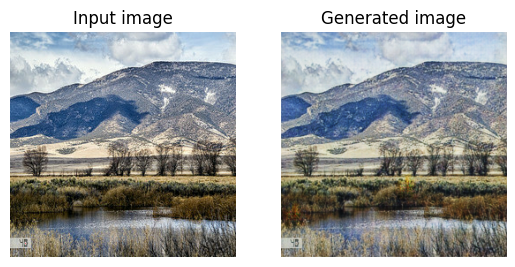

1/1 [==============================] - 1s 543ms/step


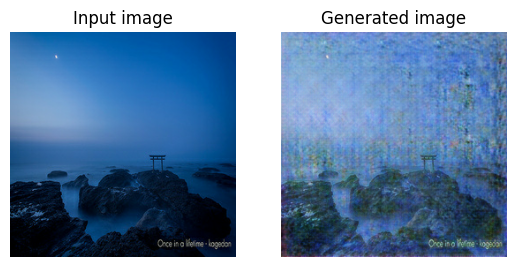

1/1 [==============================] - 1s 531ms/step


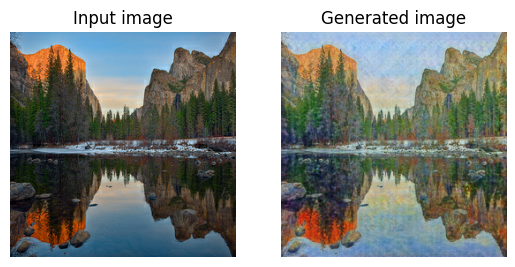

1/1 [==============================] - 1s 519ms/step


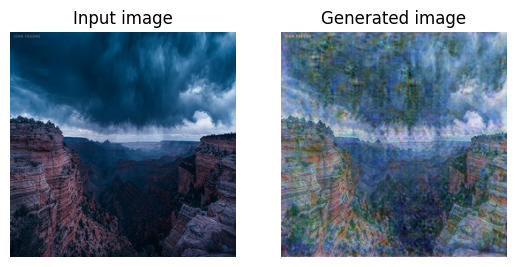

1/1 [==============================] - 1s 534ms/step


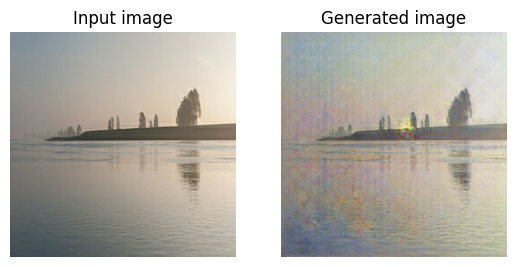

1/1 [==============================] - 1s 524ms/step


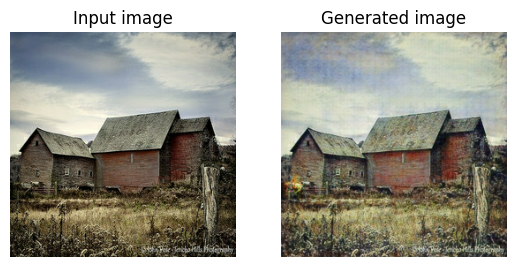

1/1 [==============================] - 1s 555ms/step


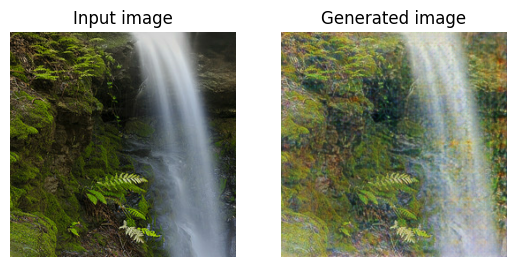

In [21]:
display_generated_samples(load_dataset(PHOTO_FILE_TFREC).batch(1), monet_generator, 7)

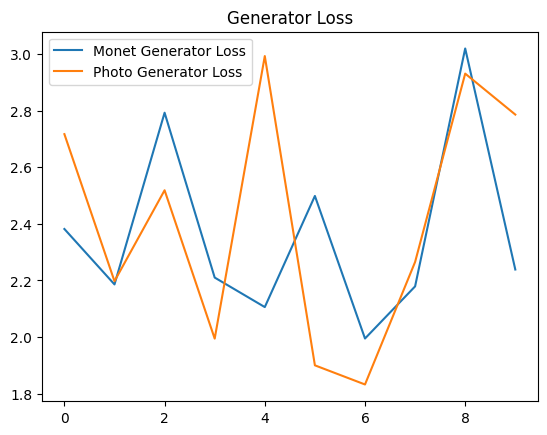

In [23]:
monet_gen_loss_values = np.mean(hist.history['monet_gen_loss'], axis=(1, 2, 3))
photo_gen_loss_values = np.mean(hist.history['photo_gen_loss'], axis=(1, 2, 3))


plt.plot(monet_gen_loss_values)
plt.plot(photo_gen_loss_values)

plt.legend(["Monet Generator Loss","Photo Generator Loss"])

plt.title("Generator Loss")
plt.show()

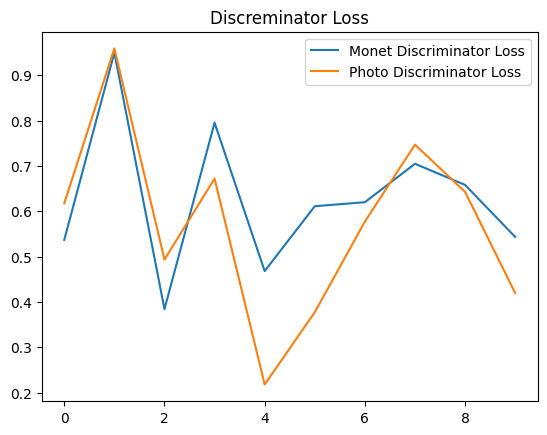

In [24]:
monet_disc_loss_values = np.mean(hist.history['monet_disc_loss'], axis=(1, 2, 3))
photo_disc_loss_values = np.mean(hist.history['photo_disc_loss'], axis=(1, 2, 3))
plt.plot(monet_disc_loss_values)
plt.plot(photo_disc_loss_values)
plt.title("Discreminator Loss")
plt.legend(["Monet Discriminator Loss","Photo Discriminator Loss"])
plt.show()


In [25]:
import os
import shutil
import PIL
def predict_and_save(input_ds, generator_model, output_path):
    i = 1
    for img in input_ds:
        prediction = generator_model(img, training=False)[0].numpy() # make predition
        prediction = (prediction * 127.5 + 127.5).astype(np.uint8)   # re-scale
        im = PIL.Image.fromarray(prediction)
        im.save(f'{output_path}{str(i)}.jpg')
        i += 1



os.makedirs('../images/') 

predict_and_save(load_dataset(PHOTO_FILE_TFREC).batch(1), monet_generator, '../images/')

shutil.make_archive('/kaggle/working/images/', 'zip', '../images')

print(f"Number of generated samples: {len([name for name in os.listdir('../images/') if os.path.isfile(os.path.join('../images/', name))])}")


Number of generated samples: 7038


Copied the files for submission.

# Conclusion

CycleGAN is a powerful deep learning model that has demonstrated remarkable capabilities in image-to-image translation tasks. It has revolutionized the field of computer vision by enabling the unsupervised learning of mappings between different visual domains, without the need for paired training data.

CycleGAN leverages the concept of cycle consistency to enforce the consistency between the translated images and their original counterparts. This allows it to learn meaningful mappings that preserve important attributes and structures of the input images. By employing adversarial training, CycleGAN also generates high-quality and realistic outputs that closely resemble the target domain.

One of the significant advantages of CycleGAN is its versatility. It can be applied to a wide range of image translation tasks, including style transfer, object transfiguration, and domain adaptation. It has been successfully used in various applications, such as artistic style transfer, photo-to-cartoon conversion, and domain adaptation for medical imaging.

However, like any deep learning model, CycleGAN has its limitations. It heavily relies on the availability of a large and diverse dataset for training to capture the variations in the target domains accurately. Moreover, training CycleGAN can be computationally intensive and time-consuming, requiring powerful hardware resources.

In summary, CycleGAN has significantly advanced the field of image-to-image translation and has opened up new possibilities for creative image manipulation and domain adaptation. It continues to be an active area of research with ongoing developments and improvements. With its ability to learn mappings without paired training data, CycleGAN holds great potential for further advancements in computer vision and image processing tasks.